In [10]:
"""
This script 
"""
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import xml.etree.ElementTree as ET
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
import mpl_toolkits.mplot3d.art3d as art3d
import cv2
import time

matplotlib.rcParams['animation.embed_limit'] = 50 # MB

tree = ET.parse('annotations_reformatted.xml')
root = tree.getroot()

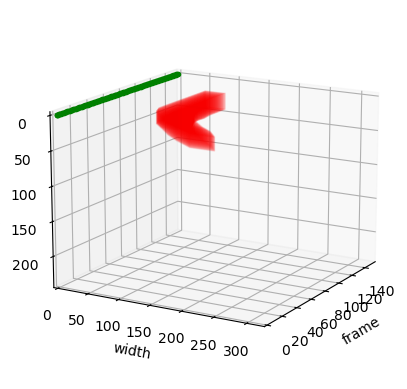

In [27]:
video = root[100]
# video = root.find(f"video[@jobid='{500827}']")
if video is None:
    raise Exception('Video not found')
filename = video.find('name').text
filepath = '/notebooks/data/Datasets/CPTAD/Videos/' + filename
cap = cv2.VideoCapture(filepath)

length = int(video.find('length').text)
width = int(video.find('width').text)
height = int(video.find('height').text)

fig = plt.figure()

ax = fig.add_subplot(projection='3d')
ax.set_xlim(0, length)
ax.set_ylim(0, width)
ax.set_zlim(0, height)
ax.invert_zaxis()
ax.invert_xaxis()
ax.set_xlabel('frame')
ax.set_ylabel('width')
ax.set_zlabel('height')
# ax.view_init(elev=15, azim=75, roll=0)

def animate(i):
    
    # im1.set_data(grab_frame(cap))
    ax.view_init(elev=15, azim=30 + i/5, roll=0)

    frames = video.find('tracks').findall(f"track/frame[@frame='{i}']")
    for frame in frames:
        
        xtl = float(frame.attrib.get('xtl'))
        ytl = float(frame.attrib.get('ytl'))
        xbr = float(frame.attrib.get('xbr'))
        ybr = float(frame.attrib.get('ybr'))
    
        alpha = 0.1

        r = Rectangle((xtl, ytl), xbr-xtl, ybr-ytl, color='r', alpha=alpha)
        ax.add_patch(r)
        art3d.pathpatch_2d_to_3d(r, z=i, zdir="x")

    ax.plot(i, 0, 0, 'g.')

ani = FuncAnimation(plt.gcf(), animate, interval=33, frames=length)

from IPython.display import HTML
HTML(ani.to_jshtml())